In [9]:
import os

import matplotlib.pyplot as plt
import numpy as np

from keras import initializers
from keras.datasets import cifar10, mnist
from keras.initializers import RandomNormal
from keras.layers import (BatchNormalization, Conv2D, Conv2DTranspose, Dense,
                          Dropout, Flatten, Input, Reshape, UpSampling2D,
                          ZeroPadding2D)
from keras.layers.advanced_activations import LeakyReLU
from keras.models import Model, Sequential
from keras.optimizers import Adam

%matplotlib inline

In [10]:
# For Consistent results
np.random.seed(77)

# The dimension of z/noise
noise_dim = 100

batch_size = 16
steps_per_epoch = 312 # 5000 / 16
epochs = 800

save_path = 'dcgan-images'

img_rows, img_cols, channels = 32, 32, 3

optimizer = Adam(0.0002, 0.5)

In [11]:
# Create path for saving images
if save_path != None and not os.path.isdir(save_path):
    os.mkdir(save_path)

In [12]:
# Load data
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

classes = {0: 'airplane', 1: 'automobile', 2: 'bird', 3: 'cat', 4: 'deer', 5: 'dog', 6: 'frog', 7: 'horse', 8: 'ship', 9: 'truck'}

In [13]:
# Normalize to between -1 and 1
x_train = (x_train.astype(np.float32) - 127.5) / 127.5

# Reshape and only save cat images,i.e. class 3
x_train = x_train[np.where(y_train == 3)[0]].reshape((-1, img_rows, img_cols, channels))

In [14]:
def create_generator():
    generator = Sequential()
    
    # Starting size
    d = 4
    generator.add(Dense(d*d*256, kernel_initializer=RandomNormal(0, 0.02), input_dim=noise_dim))
    generator.add(LeakyReLU(0.2))
    # 4x4x256
    generator.add(Reshape((d, d, 256)))
    
    # 8x8x128
    generator.add(Conv2DTranspose(128, (4, 4), strides=2, padding='same', kernel_initializer=RandomNormal(0, 0.02)))
    generator.add(LeakyReLU(0.2))
    
    # 16x16*128
    generator.add(Conv2DTranspose(128, (4, 4), strides=2, padding='same', kernel_initializer=RandomNormal(0, 0.02)))
    generator.add(LeakyReLU(0.2))
    
    # 32x32x128
    generator.add(Conv2DTranspose(128, (4, 4), strides=2, padding='same', kernel_initializer=RandomNormal(0, 0.02)))
    generator.add(LeakyReLU(0.2))
    
    # 32x32x3
    generator.add(Conv2D(channels, (3, 3), padding='same', activation='tanh', kernel_initializer=RandomNormal(0, 0.02)))
    
    generator.compile(loss='binary_crossentropy', optimizer=optimizer)
    return generator

In [15]:
def create_discriminator():
    discriminator = Sequential()
    
    discriminator.add(Conv2D(64, (3, 3), padding='same', kernel_initializer=RandomNormal(0, 0.02), input_shape=(img_cols, img_rows, channels)))
    discriminator.add(LeakyReLU(0.2))
    
    discriminator.add(Conv2D(128, (3, 3), strides=2, padding='same', kernel_initializer=RandomNormal(0, 0.02)))
    discriminator.add(LeakyReLU(0.2))
    
    discriminator.add(Conv2D(128, (3, 3), strides=2, padding='same', kernel_initializer=RandomNormal(0, 0.02)))
    discriminator.add(LeakyReLU(0.2))
    
    discriminator.add(Conv2D(256, (3, 3), strides=2, padding='same', kernel_initializer=RandomNormal(0, 0.02)))
    discriminator.add(LeakyReLU(0.2))
    
    discriminator.add(Flatten())
    discriminator.add(Dropout(0.4))
    discriminator.add(Dense(1, activation='sigmoid'))
    
    discriminator.compile(loss='binary_crossentropy', optimizer=optimizer)
    return discriminator

In [16]:
discriminator = create_discriminator()
generator = create_generator()

# Make the discriminator untrainable when we are training the generator.  
# This doesn't effect the discriminator by itself
discriminator.trainable = False

# Link the two models to create the GAN
gan_input = Input(shape=(noise_dim,))
fake_image = generator(gan_input)
gan_output = discriminator(fake_image)

gan = Model(gan_input, gan_output)
gan.compile(loss='binary_crossentropy', optimizer=optimizer)

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


In [17]:
discriminator.summary()
generator.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 32, 32, 64)        1792      
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 16, 16, 128)       73856     
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 16, 16, 128)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 8, 8, 128)         147584    
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 8, 8, 128)         0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 4, 4, 256)        

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


In [18]:
# Display images, and save them if the epoch number is specified
def show_images(noise, epoch=None):
    generated_images = generator.predict(noise)
    plt.figure(figsize=(10, 10))
    
    for i, image in enumerate(generated_images):
        plt.subplot(10, 10, i+1)
        if channels == 1:
            plt.imshow(np.clip(image.reshape((img_rows, img_cols)), 0.0, 1.0), cmap='gray')
        else:
            plt.imshow(np.clip(image.reshape((img_rows, img_cols, channels)), 0.0, 1.0))
        plt.axis('off')
    
    plt.tight_layout()
    
    if epoch != None and save_path != None:
        plt.savefig(f'{save_path}/gan-images_epoch-{epoch}.png')
    plt.show()

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


Epoch: 0 	 Discriminator Loss: 0.7477049231529236 		 Generator Loss: 0.9343949556350708


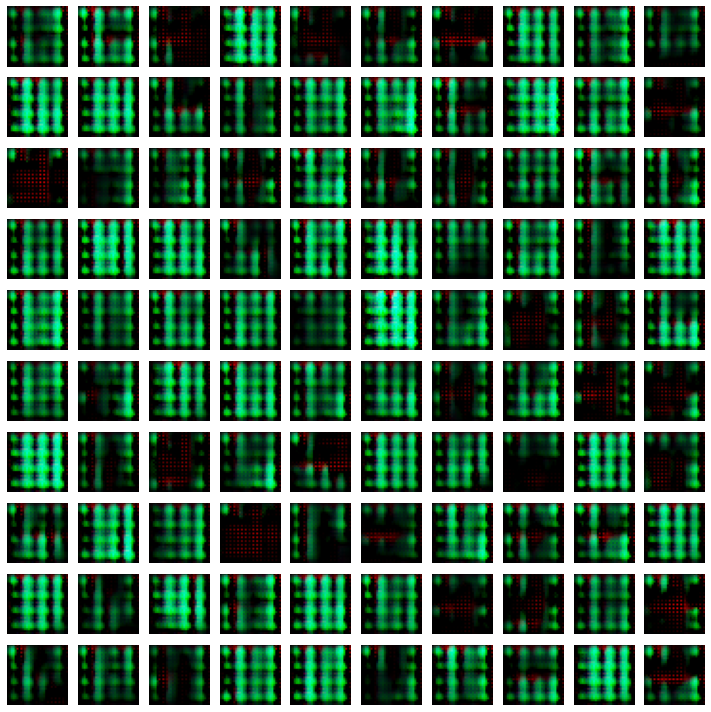

Epoch: 1 	 Discriminator Loss: 0.46591612696647644 		 Generator Loss: 1.790412187576294
Epoch: 2 	 Discriminator Loss: 0.7594943046569824 		 Generator Loss: 1.2144174575805664
Epoch: 3 	 Discriminator Loss: 0.6009334325790405 		 Generator Loss: 1.4361262321472168
Epoch: 4 	 Discriminator Loss: 0.6156049370765686 		 Generator Loss: 1.0528324842453003
Epoch: 5 	 Discriminator Loss: 0.6938300132751465 		 Generator Loss: 1.1866915225982666
Epoch: 6 	 Discriminator Loss: 0.5623211860656738 		 Generator Loss: 1.116123914718628
Epoch: 7 	 Discriminator Loss: 0.4781012535095215 		 Generator Loss: 1.4743623733520508
Epoch: 8 	 Discriminator Loss: 0.4837343692779541 		 Generator Loss: 1.3345251083374023
Epoch: 9 	 Discriminator Loss: 0.6135129332542419 		 Generator Loss: 1.1689529418945312
Epoch: 10 	 Discriminator Loss: 0.5662065744400024 		 Generator Loss: 1.1862249374389648
Epoch: 11 	 Discriminator Loss: 0.5866455435752869 		 Generator Loss: 1.0392953157424927
Epoch: 12 	 Discriminator Loss:

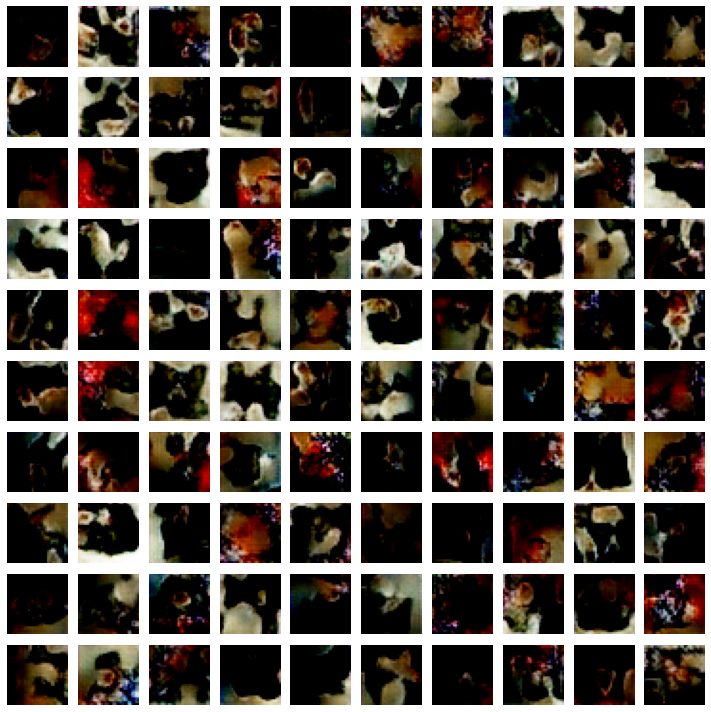

Epoch: 26 	 Discriminator Loss: 0.6170177459716797 		 Generator Loss: 0.9955134391784668
Epoch: 27 	 Discriminator Loss: 0.6295655369758606 		 Generator Loss: 1.1809372901916504
Epoch: 28 	 Discriminator Loss: 0.6163675785064697 		 Generator Loss: 1.1121885776519775
Epoch: 29 	 Discriminator Loss: 0.6889891028404236 		 Generator Loss: 0.9882194995880127
Epoch: 30 	 Discriminator Loss: 0.6237261295318604 		 Generator Loss: 0.9338875412940979
Epoch: 31 	 Discriminator Loss: 0.6334921717643738 		 Generator Loss: 0.971123218536377
Epoch: 32 	 Discriminator Loss: 0.6460325121879578 		 Generator Loss: 0.9668649435043335
Epoch: 33 	 Discriminator Loss: 0.681398868560791 		 Generator Loss: 1.0669829845428467
Epoch: 34 	 Discriminator Loss: 0.6064163446426392 		 Generator Loss: 0.9736886024475098
Epoch: 35 	 Discriminator Loss: 0.62326979637146 		 Generator Loss: 1.1758723258972168
Epoch: 36 	 Discriminator Loss: 0.6226096749305725 		 Generator Loss: 1.050522804260254
Epoch: 37 	 Discriminator 

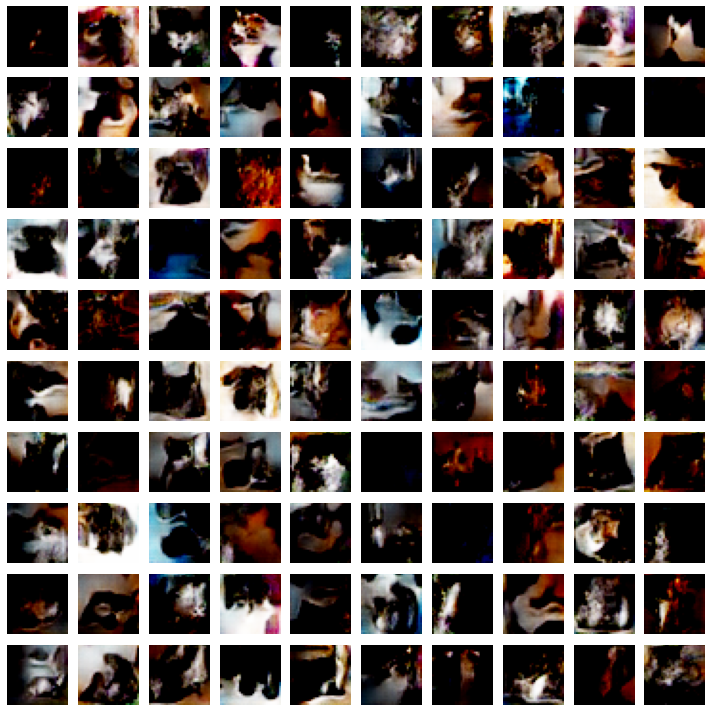

Epoch: 51 	 Discriminator Loss: 0.6334450244903564 		 Generator Loss: 1.0399253368377686
Epoch: 52 	 Discriminator Loss: 0.6652385592460632 		 Generator Loss: 1.2096621990203857
Epoch: 53 	 Discriminator Loss: 0.49942252039909363 		 Generator Loss: 1.4555119276046753
Epoch: 54 	 Discriminator Loss: 0.5883266925811768 		 Generator Loss: 1.2420318126678467
Epoch: 55 	 Discriminator Loss: 0.6085526943206787 		 Generator Loss: 1.6924911737442017
Epoch: 56 	 Discriminator Loss: 0.5670218467712402 		 Generator Loss: 1.2201184034347534
Epoch: 57 	 Discriminator Loss: 0.6277090907096863 		 Generator Loss: 1.570310354232788
Epoch: 58 	 Discriminator Loss: 0.5119422674179077 		 Generator Loss: 1.5127159357070923
Epoch: 59 	 Discriminator Loss: 0.5211366415023804 		 Generator Loss: 1.250570297241211
Epoch: 60 	 Discriminator Loss: 0.5379658937454224 		 Generator Loss: 1.3191927671432495
Epoch: 61 	 Discriminator Loss: 0.6366465091705322 		 Generator Loss: 1.2944833040237427
Epoch: 62 	 Discrimina

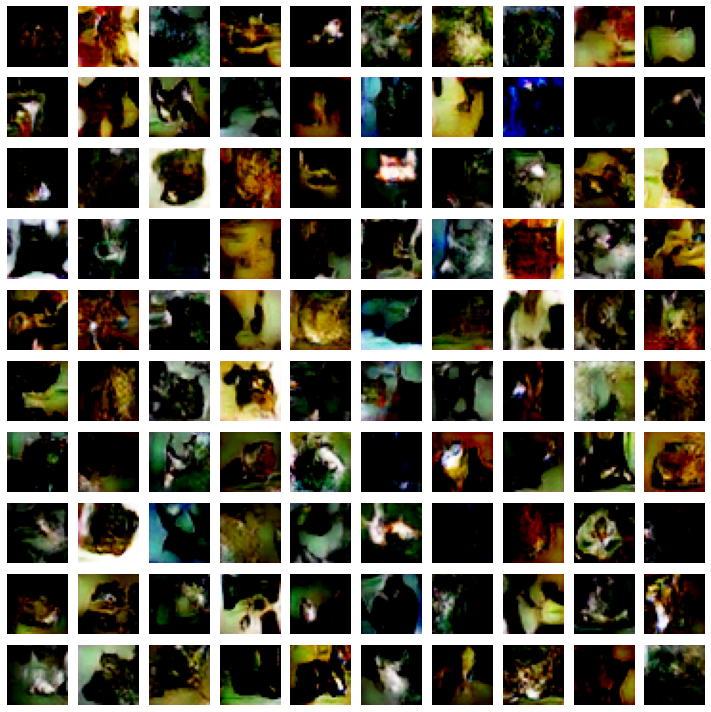

Epoch: 76 	 Discriminator Loss: 0.49103331565856934 		 Generator Loss: 1.52653968334198
Epoch: 77 	 Discriminator Loss: 0.48227405548095703 		 Generator Loss: 1.6668927669525146
Epoch: 78 	 Discriminator Loss: 0.583173394203186 		 Generator Loss: 1.4448363780975342
Epoch: 79 	 Discriminator Loss: 0.5969089269638062 		 Generator Loss: 1.6595523357391357
Epoch: 80 	 Discriminator Loss: 0.509027361869812 		 Generator Loss: 1.510810136795044
Epoch: 81 	 Discriminator Loss: 0.626502513885498 		 Generator Loss: 1.378711223602295
Epoch: 82 	 Discriminator Loss: 0.5629958510398865 		 Generator Loss: 1.4670426845550537
Epoch: 83 	 Discriminator Loss: 0.5162591338157654 		 Generator Loss: 1.2971115112304688
Epoch: 84 	 Discriminator Loss: 0.5085129737854004 		 Generator Loss: 1.2670378684997559
Epoch: 85 	 Discriminator Loss: 0.466351717710495 		 Generator Loss: 1.7997599840164185
Epoch: 86 	 Discriminator Loss: 0.6182339191436768 		 Generator Loss: 1.6201016902923584
Epoch: 87 	 Discriminator L

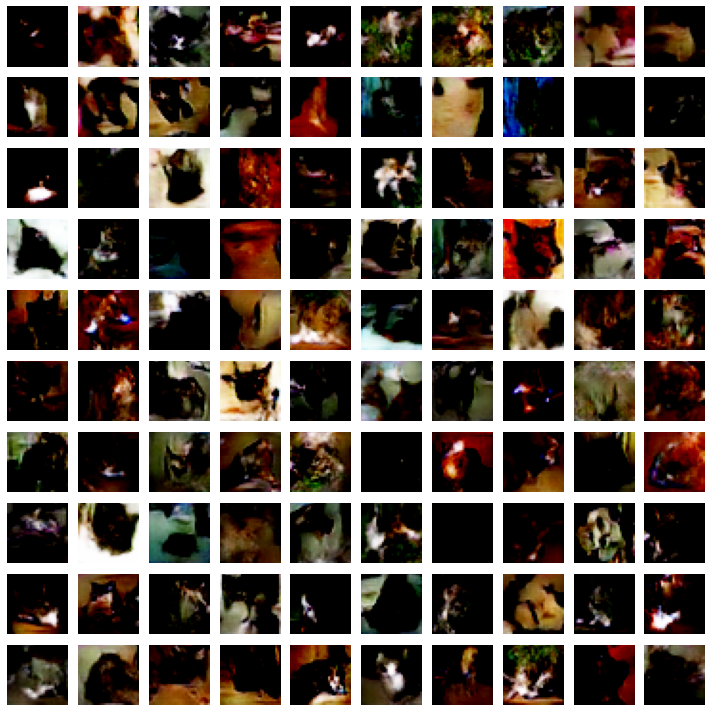

Epoch: 101 	 Discriminator Loss: 0.5499671697616577 		 Generator Loss: 1.6465916633605957
Epoch: 102 	 Discriminator Loss: 0.494954913854599 		 Generator Loss: 1.5531504154205322
Epoch: 103 	 Discriminator Loss: 0.38690057396888733 		 Generator Loss: 1.675660490989685
Epoch: 104 	 Discriminator Loss: 0.4695323407649994 		 Generator Loss: 1.6965179443359375
Epoch: 105 	 Discriminator Loss: 0.46756353974342346 		 Generator Loss: 1.6678518056869507
Epoch: 106 	 Discriminator Loss: 0.37047016620635986 		 Generator Loss: 2.5958399772644043
Epoch: 107 	 Discriminator Loss: 0.42563751339912415 		 Generator Loss: 2.1345818042755127
Epoch: 108 	 Discriminator Loss: 0.4003128409385681 		 Generator Loss: 1.5282436609268188
Epoch: 109 	 Discriminator Loss: 0.35610055923461914 		 Generator Loss: 1.7400915622711182
Epoch: 110 	 Discriminator Loss: 0.512016236782074 		 Generator Loss: 2.047083854675293
Epoch: 111 	 Discriminator Loss: 0.5164632797241211 		 Generator Loss: 1.4707202911376953
Epoch: 11

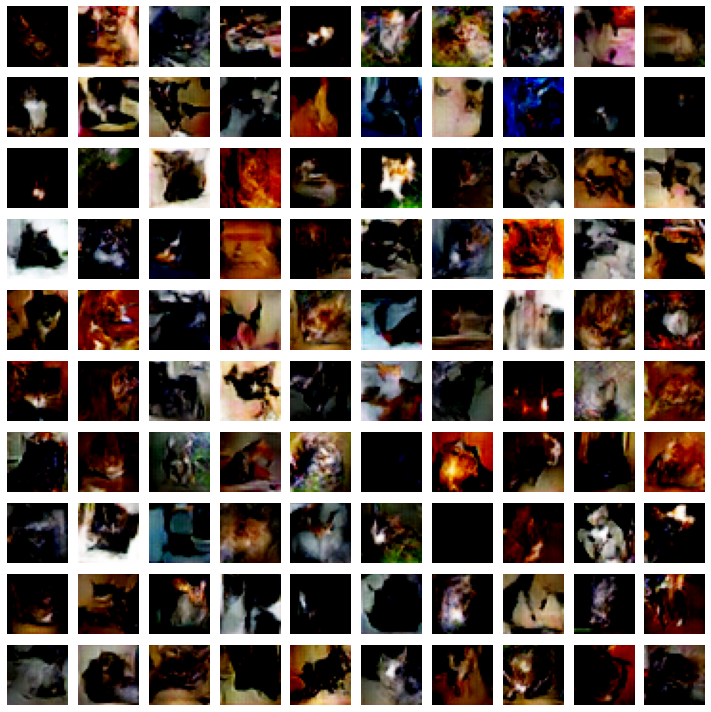

Epoch: 126 	 Discriminator Loss: 0.5707877278327942 		 Generator Loss: 2.5079474449157715
Epoch: 127 	 Discriminator Loss: 0.5810056328773499 		 Generator Loss: 2.172201156616211
Epoch: 128 	 Discriminator Loss: 0.44898033142089844 		 Generator Loss: 1.7587543725967407
Epoch: 129 	 Discriminator Loss: 0.3173374533653259 		 Generator Loss: 2.006988763809204
Epoch: 130 	 Discriminator Loss: 0.3290492594242096 		 Generator Loss: 1.7751054763793945
Epoch: 131 	 Discriminator Loss: 0.3117105960845947 		 Generator Loss: 2.4301228523254395
Epoch: 132 	 Discriminator Loss: 0.4402408301830292 		 Generator Loss: 2.111651659011841
Epoch: 133 	 Discriminator Loss: 0.44297829270362854 		 Generator Loss: 2.001286506652832
Epoch: 134 	 Discriminator Loss: 0.49655693769454956 		 Generator Loss: 1.6870615482330322
Epoch: 135 	 Discriminator Loss: 0.45188307762145996 		 Generator Loss: 1.888976812362671
Epoch: 136 	 Discriminator Loss: 0.342856764793396 		 Generator Loss: 2.251676559448242
Epoch: 137 	 

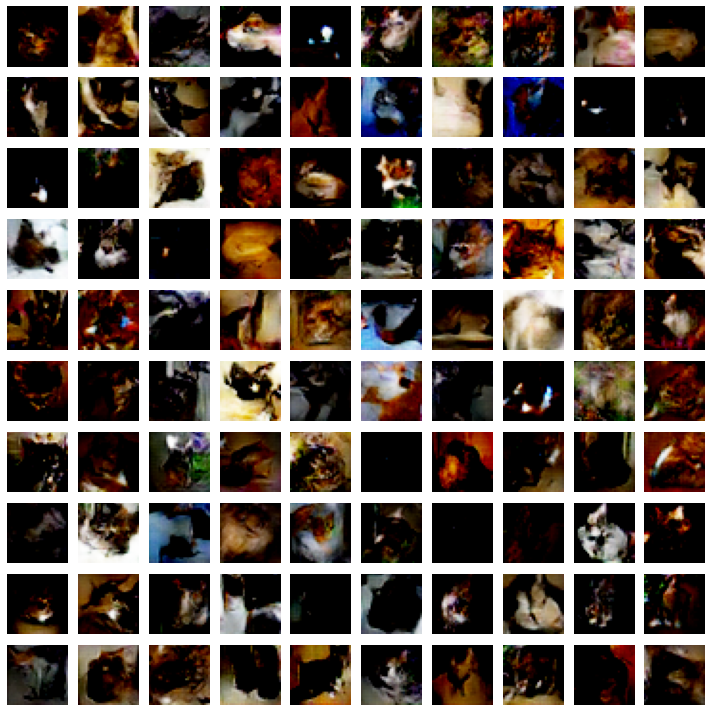

Epoch: 151 	 Discriminator Loss: 0.4652893543243408 		 Generator Loss: 1.9580470323562622
Epoch: 152 	 Discriminator Loss: 0.5579972267150879 		 Generator Loss: 2.2891788482666016
Epoch: 153 	 Discriminator Loss: 0.4740530848503113 		 Generator Loss: 2.4471473693847656
Epoch: 154 	 Discriminator Loss: 0.3328820765018463 		 Generator Loss: 2.42588472366333
Epoch: 155 	 Discriminator Loss: 0.333212673664093 		 Generator Loss: 2.3246233463287354
Epoch: 156 	 Discriminator Loss: 0.37268269062042236 		 Generator Loss: 2.542778253555298
Epoch: 157 	 Discriminator Loss: 0.3911699652671814 		 Generator Loss: 2.071805953979492
Epoch: 158 	 Discriminator Loss: 0.3804519474506378 		 Generator Loss: 2.7181949615478516
Epoch: 159 	 Discriminator Loss: 0.4316384196281433 		 Generator Loss: 2.6157922744750977
Epoch: 160 	 Discriminator Loss: 0.35740649700164795 		 Generator Loss: 3.0500988960266113
Epoch: 161 	 Discriminator Loss: 0.44935888051986694 		 Generator Loss: 2.6778745651245117
Epoch: 162 	

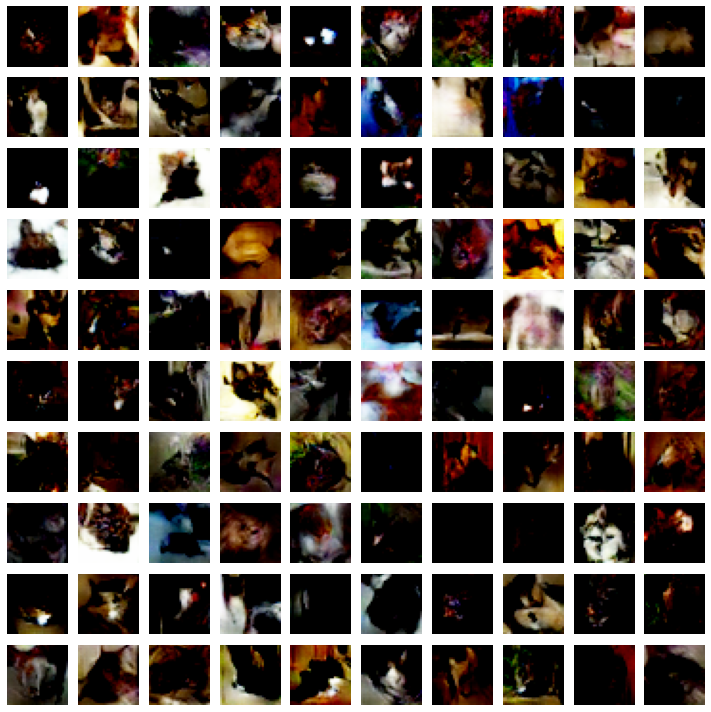

Epoch: 176 	 Discriminator Loss: 0.40037617087364197 		 Generator Loss: 2.861003875732422
Epoch: 177 	 Discriminator Loss: 0.4053897559642792 		 Generator Loss: 2.7784366607666016
Epoch: 178 	 Discriminator Loss: 0.5588376522064209 		 Generator Loss: 2.766186237335205
Epoch: 179 	 Discriminator Loss: 0.4396020174026489 		 Generator Loss: 3.0643699169158936
Epoch: 180 	 Discriminator Loss: 0.3354591429233551 		 Generator Loss: 2.91397762298584
Epoch: 181 	 Discriminator Loss: 0.3714010715484619 		 Generator Loss: 2.7835867404937744
Epoch: 182 	 Discriminator Loss: 0.3208845853805542 		 Generator Loss: 2.6405649185180664
Epoch: 183 	 Discriminator Loss: 0.3533616065979004 		 Generator Loss: 2.1674718856811523
Epoch: 184 	 Discriminator Loss: 0.3437495231628418 		 Generator Loss: 2.5701794624328613
Epoch: 185 	 Discriminator Loss: 0.4290482699871063 		 Generator Loss: 2.365561008453369
Epoch: 186 	 Discriminator Loss: 0.30072641372680664 		 Generator Loss: 2.900458574295044
Epoch: 187 	 D

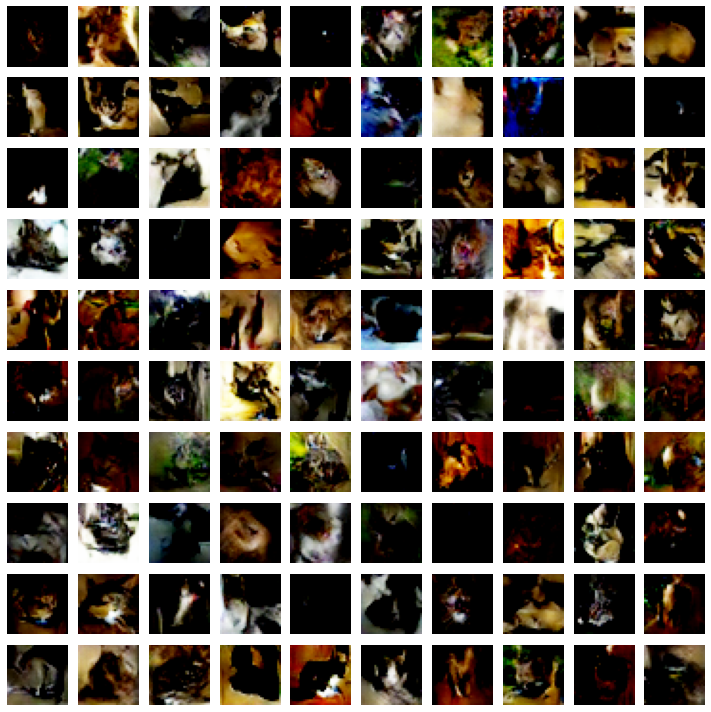

Epoch: 201 	 Discriminator Loss: 0.3459525406360626 		 Generator Loss: 3.0409390926361084
Epoch: 202 	 Discriminator Loss: 0.32539162039756775 		 Generator Loss: 3.8130950927734375
Epoch: 203 	 Discriminator Loss: 0.364559143781662 		 Generator Loss: 2.1359457969665527
Epoch: 204 	 Discriminator Loss: 0.3556997776031494 		 Generator Loss: 2.6757214069366455
Epoch: 205 	 Discriminator Loss: 0.30981919169425964 		 Generator Loss: 2.559173583984375
Epoch: 206 	 Discriminator Loss: 0.42569971084594727 		 Generator Loss: 2.6242246627807617
Epoch: 207 	 Discriminator Loss: 0.3632511794567108 		 Generator Loss: 2.4623827934265137
Epoch: 208 	 Discriminator Loss: 0.3274917006492615 		 Generator Loss: 3.4034838676452637
Epoch: 209 	 Discriminator Loss: 0.3780628442764282 		 Generator Loss: 3.237407684326172
Epoch: 210 	 Discriminator Loss: 0.35900548100471497 		 Generator Loss: 2.3922667503356934
Epoch: 211 	 Discriminator Loss: 0.3113449513912201 		 Generator Loss: 3.1234467029571533
Epoch: 21

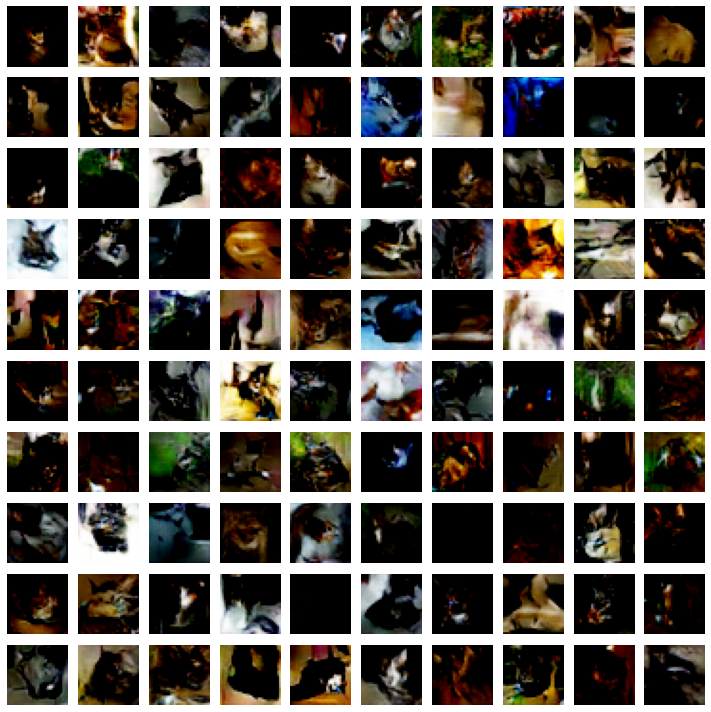

Epoch: 226 	 Discriminator Loss: 0.2947542667388916 		 Generator Loss: 2.9389240741729736
Epoch: 227 	 Discriminator Loss: 0.34958022832870483 		 Generator Loss: 3.7843732833862305
Epoch: 228 	 Discriminator Loss: 0.4313068091869354 		 Generator Loss: 2.591752290725708
Epoch: 229 	 Discriminator Loss: 0.28977954387664795 		 Generator Loss: 2.9523582458496094
Epoch: 230 	 Discriminator Loss: 0.2921608090400696 		 Generator Loss: 2.852839469909668
Epoch: 231 	 Discriminator Loss: 0.3654312491416931 		 Generator Loss: 2.811487913131714
Epoch: 232 	 Discriminator Loss: 0.4200156033039093 		 Generator Loss: 2.7077555656433105
Epoch: 233 	 Discriminator Loss: 0.2816348373889923 		 Generator Loss: 3.284799575805664
Epoch: 234 	 Discriminator Loss: 0.34354448318481445 		 Generator Loss: 3.8268935680389404
Epoch: 235 	 Discriminator Loss: 0.34833282232284546 		 Generator Loss: 2.3793935775756836
Epoch: 236 	 Discriminator Loss: 0.5142961144447327 		 Generator Loss: 3.5522069931030273
Epoch: 237

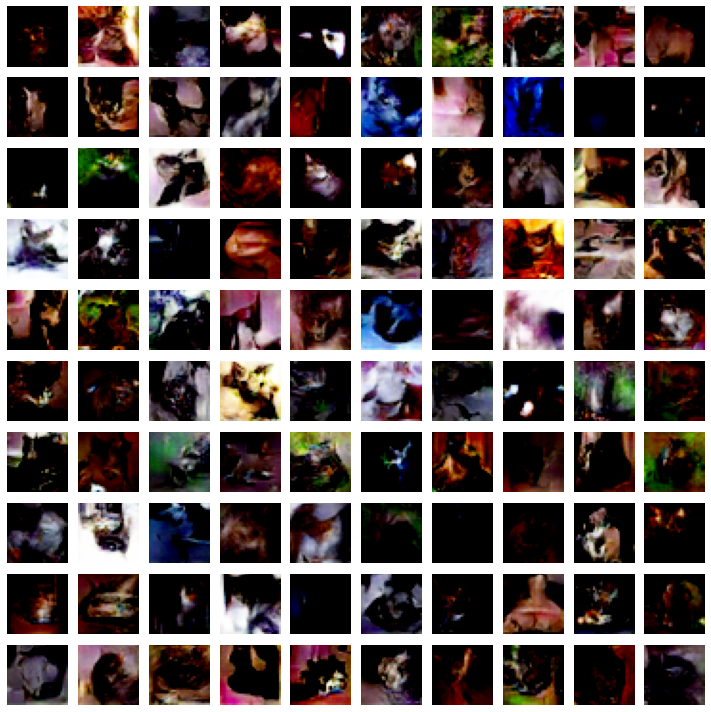

Epoch: 251 	 Discriminator Loss: 0.28905612230300903 		 Generator Loss: 3.041505813598633
Epoch: 252 	 Discriminator Loss: 0.2691955864429474 		 Generator Loss: 3.0090203285217285
Epoch: 253 	 Discriminator Loss: 0.40846824645996094 		 Generator Loss: 3.0489017963409424
Epoch: 254 	 Discriminator Loss: 0.2823346257209778 		 Generator Loss: 3.0725436210632324
Epoch: 255 	 Discriminator Loss: 0.32793137431144714 		 Generator Loss: 2.6662380695343018
Epoch: 256 	 Discriminator Loss: 0.30491337180137634 		 Generator Loss: 3.0011048316955566
Epoch: 257 	 Discriminator Loss: 0.42005234956741333 		 Generator Loss: 3.171537399291992
Epoch: 258 	 Discriminator Loss: 0.28338536620140076 		 Generator Loss: 2.870861053466797
Epoch: 259 	 Discriminator Loss: 0.32039371132850647 		 Generator Loss: 3.4276609420776367
Epoch: 260 	 Discriminator Loss: 0.3037319481372833 		 Generator Loss: 2.706348180770874
Epoch: 261 	 Discriminator Loss: 0.34096622467041016 		 Generator Loss: 2.9168591499328613
Epoch:

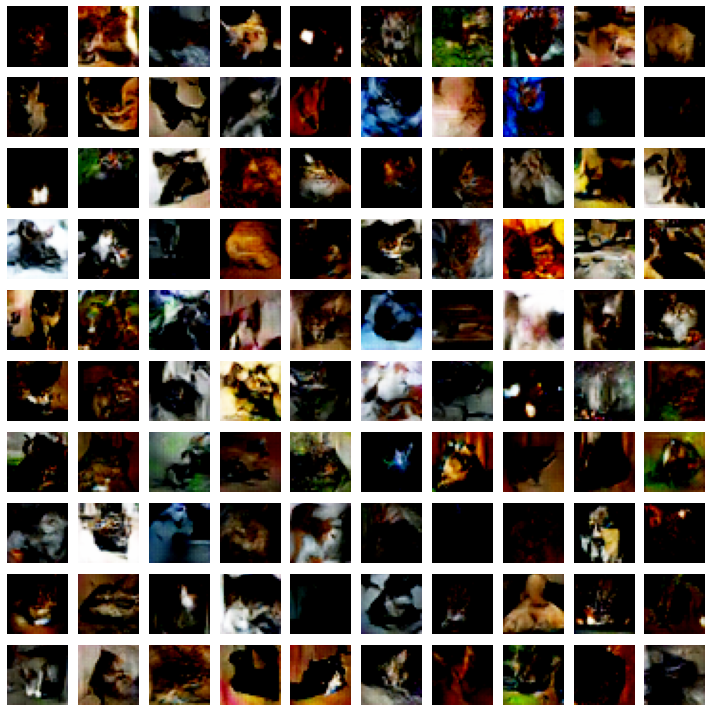

Epoch: 276 	 Discriminator Loss: 0.293203204870224 		 Generator Loss: 3.1376242637634277
Epoch: 277 	 Discriminator Loss: 0.31533583998680115 		 Generator Loss: 3.4854278564453125
Epoch: 278 	 Discriminator Loss: 0.2690398097038269 		 Generator Loss: 4.041245460510254
Epoch: 279 	 Discriminator Loss: 0.480161190032959 		 Generator Loss: 2.839883804321289
Epoch: 280 	 Discriminator Loss: 0.3123835027217865 		 Generator Loss: 3.178574562072754
Epoch: 281 	 Discriminator Loss: 0.28218188881874084 		 Generator Loss: 4.309669494628906
Epoch: 282 	 Discriminator Loss: 0.355758935213089 		 Generator Loss: 3.941494941711426
Epoch: 283 	 Discriminator Loss: 0.4006969928741455 		 Generator Loss: 2.688699722290039
Epoch: 284 	 Discriminator Loss: 0.32176637649536133 		 Generator Loss: 2.5958762168884277
Epoch: 285 	 Discriminator Loss: 0.26781463623046875 		 Generator Loss: 3.643484354019165
Epoch: 286 	 Discriminator Loss: 0.3890797197818756 		 Generator Loss: 3.2562246322631836
Epoch: 287 	 Dis

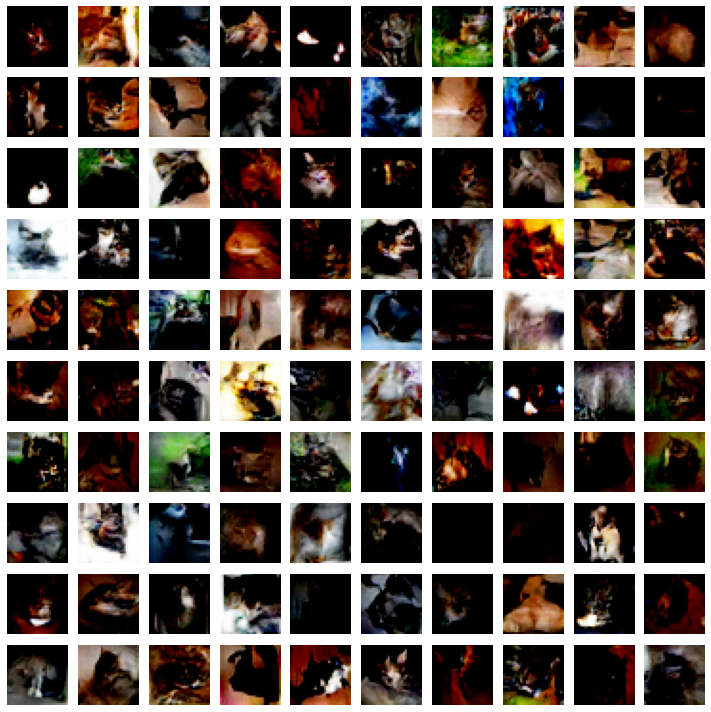

Epoch: 301 	 Discriminator Loss: 0.285452663898468 		 Generator Loss: 3.970238447189331
Epoch: 302 	 Discriminator Loss: 0.2642347514629364 		 Generator Loss: 3.0473015308380127
Epoch: 303 	 Discriminator Loss: 0.3181566894054413 		 Generator Loss: 2.696941614151001
Epoch: 304 	 Discriminator Loss: 0.33432555198669434 		 Generator Loss: 3.4922685623168945
Epoch: 305 	 Discriminator Loss: 0.2922320067882538 		 Generator Loss: 2.8782849311828613
Epoch: 306 	 Discriminator Loss: 0.35474443435668945 		 Generator Loss: 3.3894662857055664
Epoch: 307 	 Discriminator Loss: 0.32122963666915894 		 Generator Loss: 2.9077343940734863
Epoch: 308 	 Discriminator Loss: 0.376811683177948 		 Generator Loss: 3.6471686363220215
Epoch: 309 	 Discriminator Loss: 0.26448261737823486 		 Generator Loss: 3.515416145324707
Epoch: 310 	 Discriminator Loss: 0.2768167555332184 		 Generator Loss: 4.398487091064453
Epoch: 311 	 Discriminator Loss: 0.31432467699050903 		 Generator Loss: 3.419278144836426
Epoch: 312 	

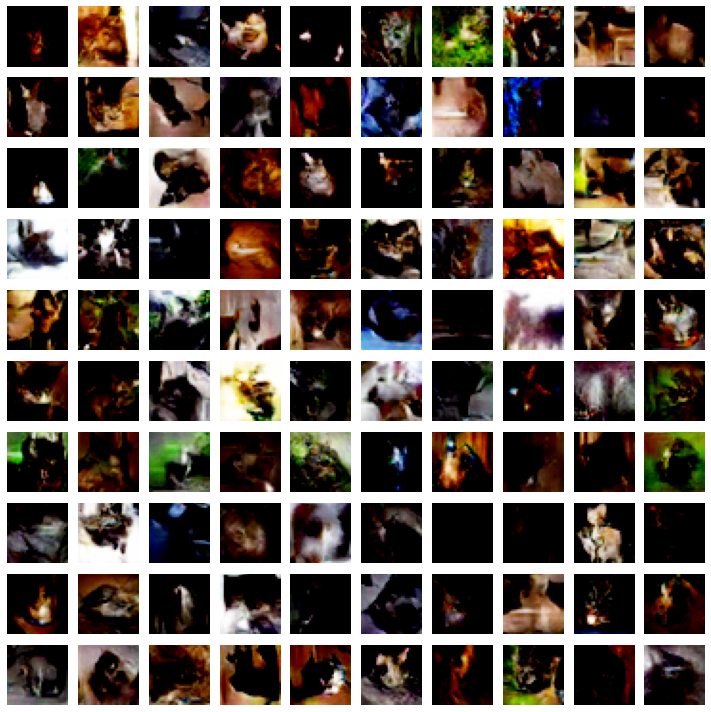

Epoch: 326 	 Discriminator Loss: 0.2656042277812958 		 Generator Loss: 2.8152360916137695
Epoch: 327 	 Discriminator Loss: 0.33751004934310913 		 Generator Loss: 3.60479998588562
Epoch: 328 	 Discriminator Loss: 0.3817242980003357 		 Generator Loss: 2.825834274291992
Epoch: 329 	 Discriminator Loss: 0.26252710819244385 		 Generator Loss: 3.8460984230041504
Epoch: 330 	 Discriminator Loss: 0.2726022005081177 		 Generator Loss: 3.678715705871582
Epoch: 331 	 Discriminator Loss: 0.25413382053375244 		 Generator Loss: 3.14276385307312
Epoch: 332 	 Discriminator Loss: 0.44222691655158997 		 Generator Loss: 3.1120128631591797
Epoch: 333 	 Discriminator Loss: 0.4490235447883606 		 Generator Loss: 2.933662176132202
Epoch: 334 	 Discriminator Loss: 0.3307949900627136 		 Generator Loss: 3.6210832595825195
Epoch: 335 	 Discriminator Loss: 0.27374735474586487 		 Generator Loss: 3.0153021812438965
Epoch: 336 	 Discriminator Loss: 0.23745107650756836 		 Generator Loss: 3.35664701461792
Epoch: 337 	 

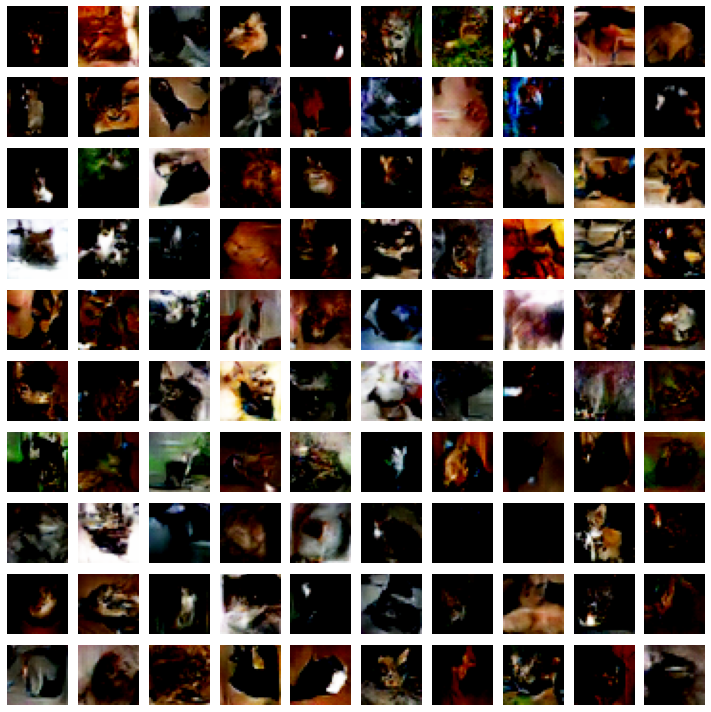

Epoch: 351 	 Discriminator Loss: 0.280805766582489 		 Generator Loss: 3.5820891857147217
Epoch: 352 	 Discriminator Loss: 0.20502717792987823 		 Generator Loss: 3.8031182289123535
Epoch: 353 	 Discriminator Loss: 0.30791038274765015 		 Generator Loss: 3.273494243621826
Epoch: 354 	 Discriminator Loss: 0.26078665256500244 		 Generator Loss: 3.178231716156006
Epoch: 355 	 Discriminator Loss: 0.357263445854187 		 Generator Loss: 3.8573358058929443
Epoch: 356 	 Discriminator Loss: 0.29573917388916016 		 Generator Loss: 2.6451220512390137
Epoch: 357 	 Discriminator Loss: 0.30910831689834595 		 Generator Loss: 4.133557319641113
Epoch: 358 	 Discriminator Loss: 0.28476065397262573 		 Generator Loss: 2.8707733154296875
Epoch: 359 	 Discriminator Loss: 0.4182509779930115 		 Generator Loss: 3.4519176483154297
Epoch: 360 	 Discriminator Loss: 0.35739704966545105 		 Generator Loss: 3.600026845932007
Epoch: 361 	 Discriminator Loss: 0.24676409363746643 		 Generator Loss: 3.63588809967041
Epoch: 362

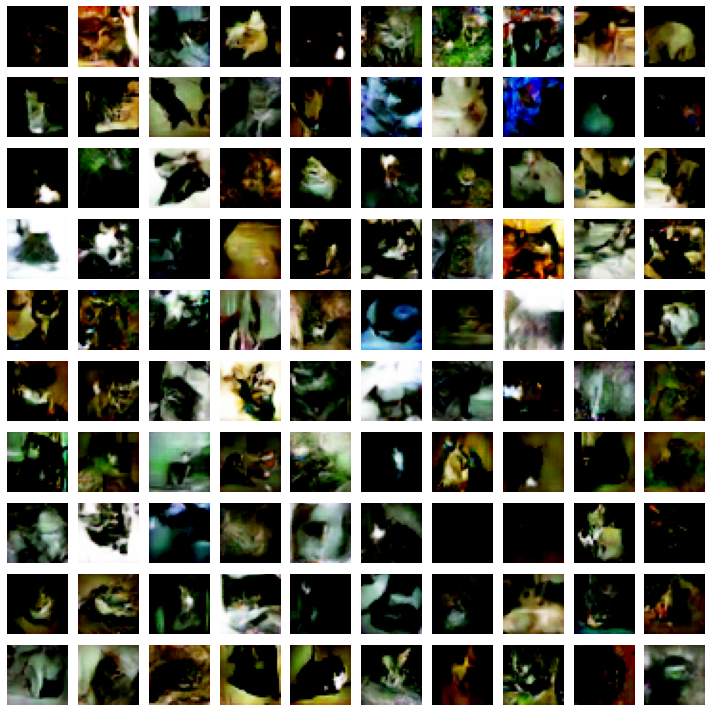

Epoch: 376 	 Discriminator Loss: 0.28145989775657654 		 Generator Loss: 2.956399917602539
Epoch: 377 	 Discriminator Loss: 0.2680375277996063 		 Generator Loss: 3.1387200355529785
Epoch: 378 	 Discriminator Loss: 0.24040256440639496 		 Generator Loss: 3.649458885192871
Epoch: 379 	 Discriminator Loss: 0.2951737940311432 		 Generator Loss: 3.1602234840393066
Epoch: 380 	 Discriminator Loss: 0.2950325906276703 		 Generator Loss: 3.7943224906921387
Epoch: 381 	 Discriminator Loss: 0.3332458436489105 		 Generator Loss: 3.462170124053955
Epoch: 382 	 Discriminator Loss: 0.2965731918811798 		 Generator Loss: 3.3745689392089844
Epoch: 383 	 Discriminator Loss: 0.2565258741378784 		 Generator Loss: 3.597971200942993
Epoch: 384 	 Discriminator Loss: 0.30257126688957214 		 Generator Loss: 2.844120740890503
Epoch: 385 	 Discriminator Loss: 0.23538556694984436 		 Generator Loss: 4.036980152130127
Epoch: 386 	 Discriminator Loss: 0.2601246237754822 		 Generator Loss: 3.3761308193206787
Epoch: 387 	

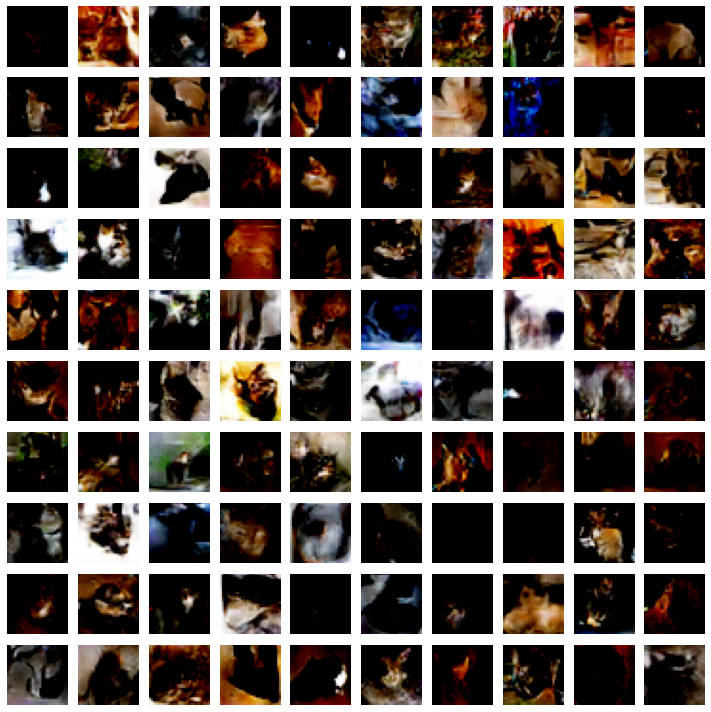

Epoch: 401 	 Discriminator Loss: 0.27556338906288147 		 Generator Loss: 3.1233749389648438
Epoch: 402 	 Discriminator Loss: 0.2707870900630951 		 Generator Loss: 4.271363735198975
Epoch: 403 	 Discriminator Loss: 0.2737387716770172 		 Generator Loss: 3.5098390579223633
Epoch: 404 	 Discriminator Loss: 0.3515954613685608 		 Generator Loss: 3.5197765827178955
Epoch: 405 	 Discriminator Loss: 0.27008694410324097 		 Generator Loss: 4.0096540451049805
Epoch: 406 	 Discriminator Loss: 0.3598784804344177 		 Generator Loss: 3.1744918823242188
Epoch: 407 	 Discriminator Loss: 0.23600757122039795 		 Generator Loss: 3.89072585105896
Epoch: 408 	 Discriminator Loss: 0.38882187008857727 		 Generator Loss: 4.252697944641113
Epoch: 409 	 Discriminator Loss: 0.23961693048477173 		 Generator Loss: 3.248065948486328
Epoch: 410 	 Discriminator Loss: 0.2956152856349945 		 Generator Loss: 3.673398494720459
Epoch: 411 	 Discriminator Loss: 0.31695449352264404 		 Generator Loss: 3.187101125717163
Epoch: 412 

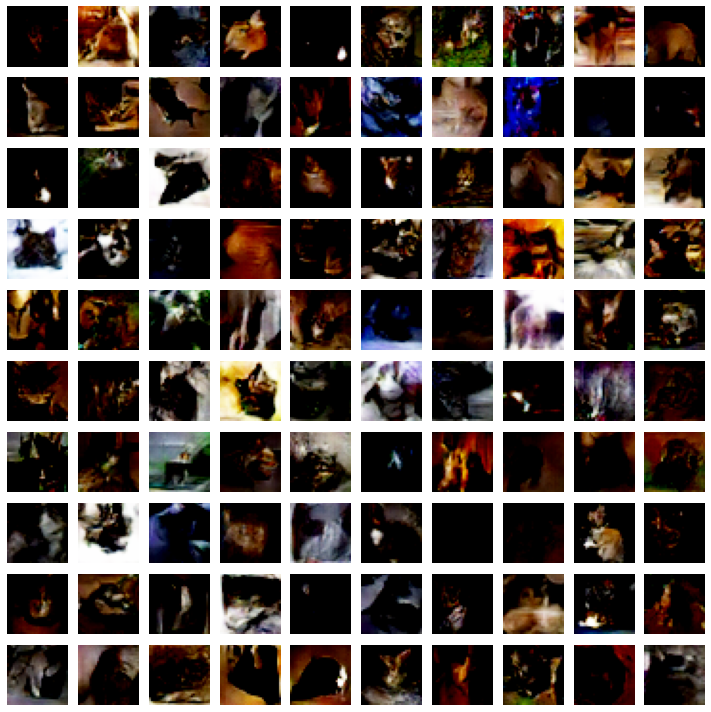

Epoch: 426 	 Discriminator Loss: 0.33856528997421265 		 Generator Loss: 3.1274304389953613
Epoch: 427 	 Discriminator Loss: 0.3451656699180603 		 Generator Loss: 4.149746894836426
Epoch: 428 	 Discriminator Loss: 0.2893494963645935 		 Generator Loss: 3.025663137435913
Epoch: 429 	 Discriminator Loss: 0.2675844132900238 		 Generator Loss: 3.8246407508850098
Epoch: 430 	 Discriminator Loss: 0.2824755311012268 		 Generator Loss: 3.6948819160461426
Epoch: 431 	 Discriminator Loss: 0.25404298305511475 		 Generator Loss: 3.13450288772583
Epoch: 432 	 Discriminator Loss: 0.24230560660362244 		 Generator Loss: 3.9575841426849365
Epoch: 433 	 Discriminator Loss: 0.23259511590003967 		 Generator Loss: 3.96120548248291
Epoch: 434 	 Discriminator Loss: 0.2696093022823334 		 Generator Loss: 4.746613502502441
Epoch: 435 	 Discriminator Loss: 0.26934167742729187 		 Generator Loss: 4.639787197113037
Epoch: 436 	 Discriminator Loss: 0.2518121004104614 		 Generator Loss: 4.22636604309082
Epoch: 437 	 Di

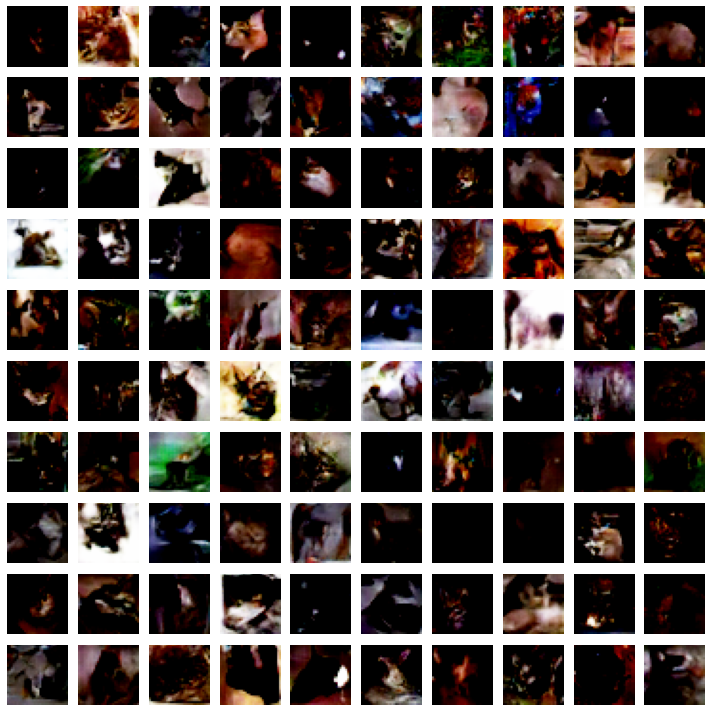

Epoch: 451 	 Discriminator Loss: 0.25017303228378296 		 Generator Loss: 3.517613172531128
Epoch: 452 	 Discriminator Loss: 0.2996535897254944 		 Generator Loss: 4.389688014984131
Epoch: 453 	 Discriminator Loss: 0.27212217450141907 		 Generator Loss: 4.112788200378418
Epoch: 454 	 Discriminator Loss: 0.23890376091003418 		 Generator Loss: 4.508730411529541
Epoch: 455 	 Discriminator Loss: 0.3269854187965393 		 Generator Loss: 3.350271701812744
Epoch: 456 	 Discriminator Loss: 0.3514809012413025 		 Generator Loss: 3.1524200439453125
Epoch: 457 	 Discriminator Loss: 0.2805509865283966 		 Generator Loss: 3.8867170810699463
Epoch: 458 	 Discriminator Loss: 0.2664634585380554 		 Generator Loss: 3.648705244064331
Epoch: 459 	 Discriminator Loss: 0.24436581134796143 		 Generator Loss: 3.4777488708496094
Epoch: 460 	 Discriminator Loss: 0.2109973281621933 		 Generator Loss: 4.198673248291016
Epoch: 461 	 Discriminator Loss: 0.2379067987203598 		 Generator Loss: 4.514072895050049
Epoch: 462 	 D

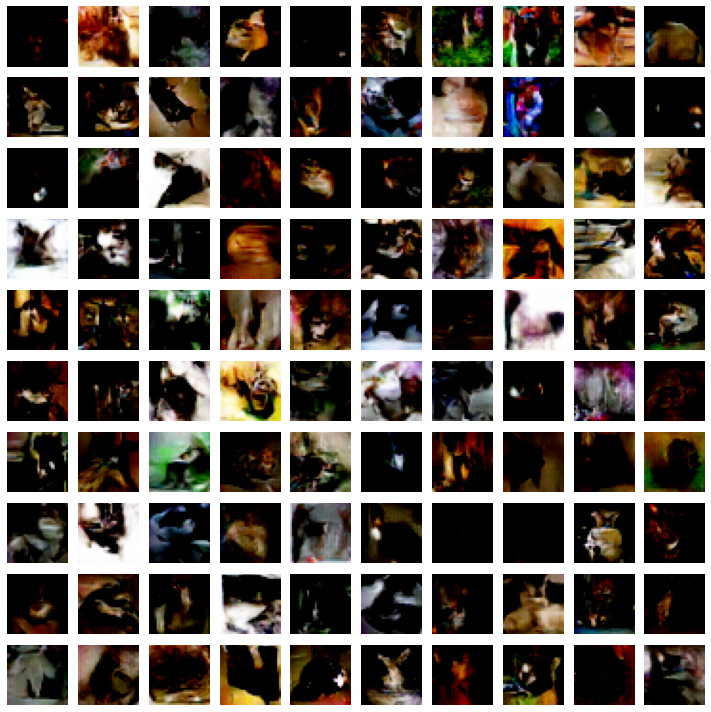

Epoch: 476 	 Discriminator Loss: 0.2600969076156616 		 Generator Loss: 3.9460761547088623
Epoch: 477 	 Discriminator Loss: 0.258355975151062 		 Generator Loss: 4.656548023223877
Epoch: 478 	 Discriminator Loss: 0.23612497746944427 		 Generator Loss: 3.324754238128662
Epoch: 479 	 Discriminator Loss: 0.27293702960014343 		 Generator Loss: 4.07338809967041
Epoch: 480 	 Discriminator Loss: 0.23441649973392487 		 Generator Loss: 3.87974214553833
Epoch: 481 	 Discriminator Loss: 0.3458520770072937 		 Generator Loss: 4.045592308044434
Epoch: 482 	 Discriminator Loss: 0.2669941186904907 		 Generator Loss: 3.754258632659912
Epoch: 483 	 Discriminator Loss: 0.2635146677494049 		 Generator Loss: 4.246736526489258
Epoch: 484 	 Discriminator Loss: 0.27787816524505615 		 Generator Loss: 3.6015102863311768
Epoch: 485 	 Discriminator Loss: 0.2527123689651489 		 Generator Loss: 3.4315457344055176
Epoch: 486 	 Discriminator Loss: 0.3380829095840454 		 Generator Loss: 4.740868091583252
Epoch: 487 	 Disc

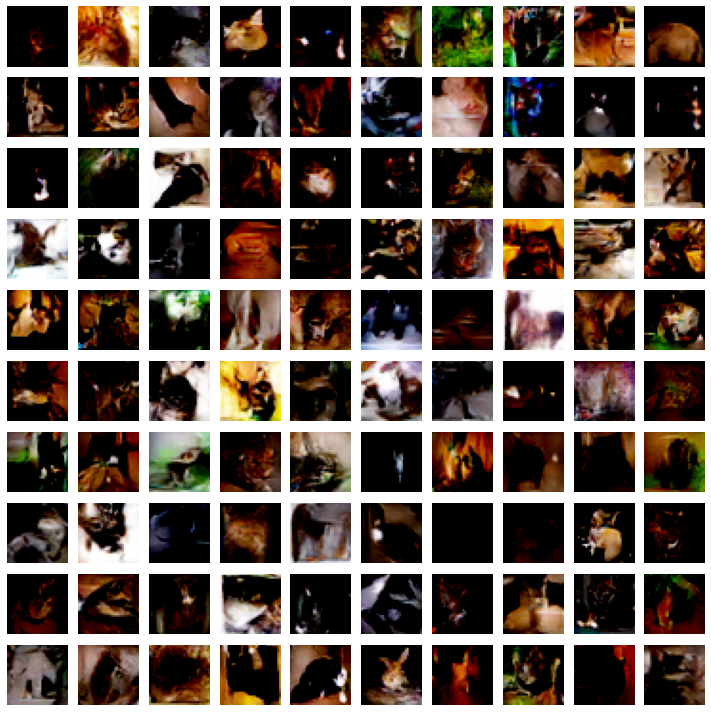

Epoch: 501 	 Discriminator Loss: 0.28754758834838867 		 Generator Loss: 4.095200538635254
Epoch: 502 	 Discriminator Loss: 0.2557756006717682 		 Generator Loss: 3.6472926139831543
Epoch: 503 	 Discriminator Loss: 0.2515866458415985 		 Generator Loss: 3.991922616958618
Epoch: 504 	 Discriminator Loss: 0.2691408693790436 		 Generator Loss: 3.5308327674865723
Epoch: 505 	 Discriminator Loss: 0.27580025792121887 		 Generator Loss: 3.213214635848999
Epoch: 506 	 Discriminator Loss: 0.30218246579170227 		 Generator Loss: 3.2482762336730957
Epoch: 507 	 Discriminator Loss: 0.23483014106750488 		 Generator Loss: 3.1849074363708496
Epoch: 508 	 Discriminator Loss: 0.2445143461227417 		 Generator Loss: 4.051658630371094
Epoch: 509 	 Discriminator Loss: 0.2951686978340149 		 Generator Loss: 3.3602895736694336
Epoch: 510 	 Discriminator Loss: 0.275333434343338 		 Generator Loss: 4.011406421661377
Epoch: 511 	 Discriminator Loss: 0.3036547601222992 		 Generator Loss: 3.742236375808716
Epoch: 512 	 

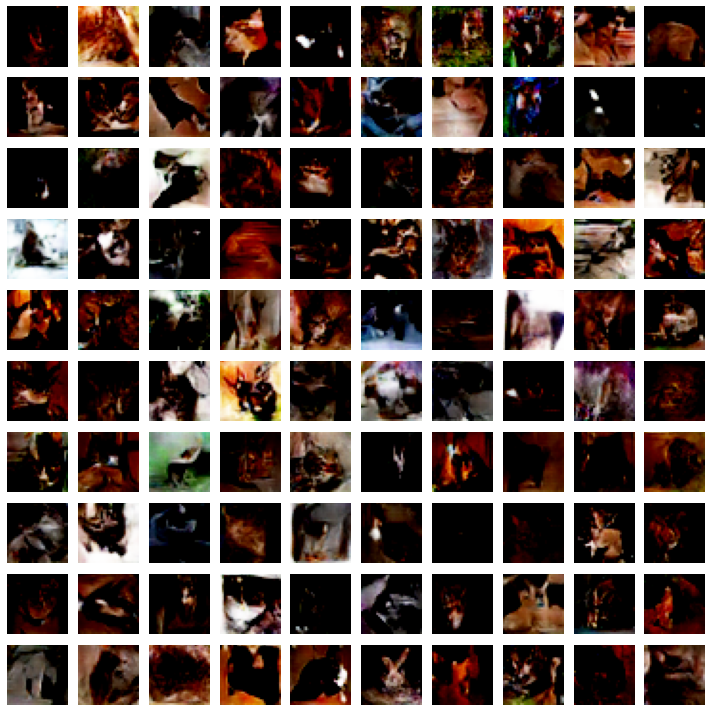

Epoch: 526 	 Discriminator Loss: 0.24405618011951447 		 Generator Loss: 4.006807804107666
Epoch: 527 	 Discriminator Loss: 0.3048292398452759 		 Generator Loss: 4.657884120941162
Epoch: 528 	 Discriminator Loss: 0.24519795179367065 		 Generator Loss: 3.785731315612793
Epoch: 529 	 Discriminator Loss: 0.2589064836502075 		 Generator Loss: 3.627835273742676
Epoch: 530 	 Discriminator Loss: 0.2514992654323578 		 Generator Loss: 3.8572821617126465
Epoch: 531 	 Discriminator Loss: 0.31771281361579895 		 Generator Loss: 3.698457717895508
Epoch: 532 	 Discriminator Loss: 0.22766602039337158 		 Generator Loss: 4.611559867858887
Epoch: 533 	 Discriminator Loss: 0.23537461459636688 		 Generator Loss: 4.284054756164551
Epoch: 534 	 Discriminator Loss: 0.26254868507385254 		 Generator Loss: 3.7896881103515625
Epoch: 535 	 Discriminator Loss: 0.27892786264419556 		 Generator Loss: 3.8438098430633545
Epoch: 536 	 Discriminator Loss: 0.28006482124328613 		 Generator Loss: 3.675912618637085
Epoch: 537

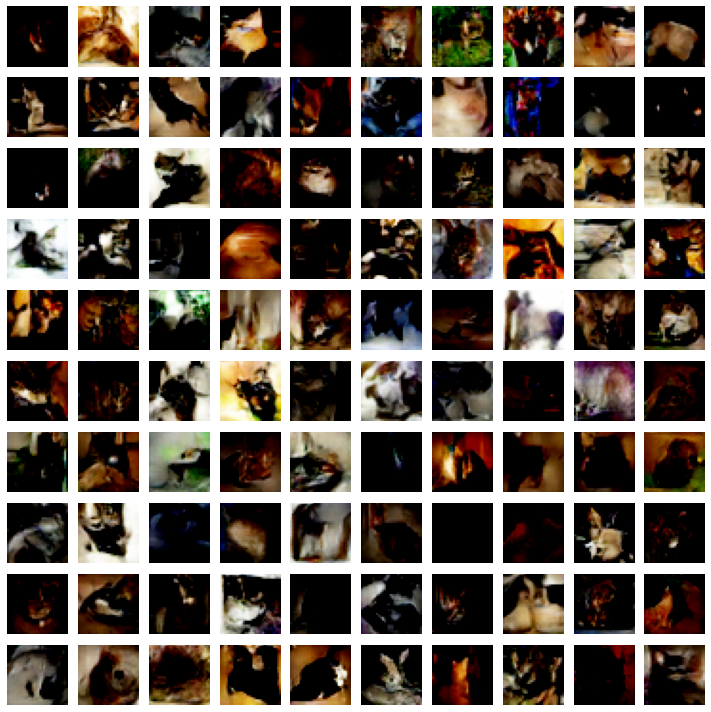

Epoch: 551 	 Discriminator Loss: 0.2933531701564789 		 Generator Loss: 3.908731460571289
Epoch: 552 	 Discriminator Loss: 0.34252434968948364 		 Generator Loss: 4.546787738800049
Epoch: 553 	 Discriminator Loss: 0.3012472987174988 		 Generator Loss: 4.576604843139648
Epoch: 554 	 Discriminator Loss: 0.3542267382144928 		 Generator Loss: 4.191542625427246
Epoch: 555 	 Discriminator Loss: 0.27649569511413574 		 Generator Loss: 4.60310173034668
Epoch: 556 	 Discriminator Loss: 0.29780158400535583 		 Generator Loss: 4.623415946960449
Epoch: 557 	 Discriminator Loss: 0.2892704904079437 		 Generator Loss: 3.2039127349853516
Epoch: 558 	 Discriminator Loss: 0.2532291114330292 		 Generator Loss: 3.8972177505493164
Epoch: 559 	 Discriminator Loss: 0.2598671317100525 		 Generator Loss: 4.827226161956787
Epoch: 560 	 Discriminator Loss: 0.24022029340267181 		 Generator Loss: 3.6670241355895996
Epoch: 561 	 Discriminator Loss: 0.23107516765594482 		 Generator Loss: 3.4042608737945557
Epoch: 562 	 

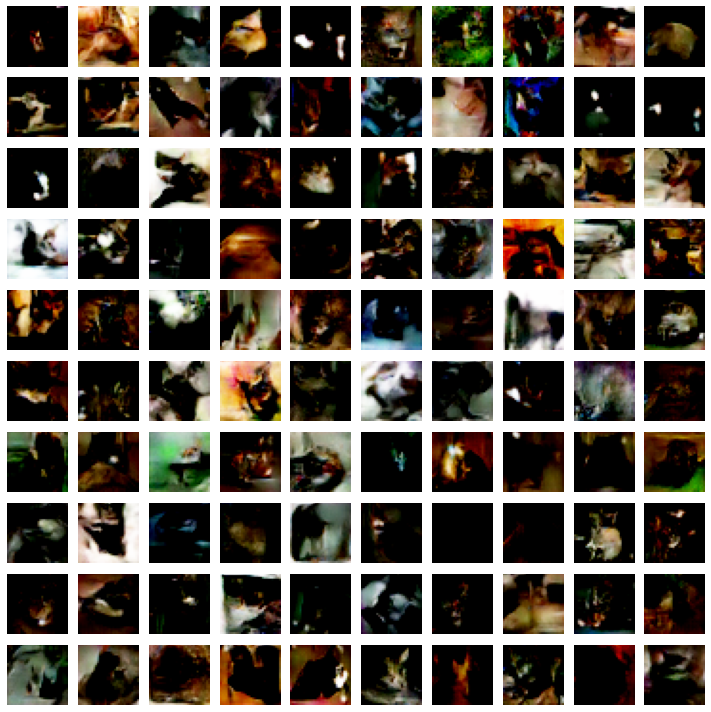

Epoch: 576 	 Discriminator Loss: 0.22835387289524078 		 Generator Loss: 3.9239118099212646
Epoch: 577 	 Discriminator Loss: 0.24053192138671875 		 Generator Loss: 3.873795986175537
Epoch: 578 	 Discriminator Loss: 0.26382625102996826 		 Generator Loss: 4.335476875305176
Epoch: 579 	 Discriminator Loss: 0.23841263353824615 		 Generator Loss: 3.547682046890259
Epoch: 580 	 Discriminator Loss: 0.2770211100578308 		 Generator Loss: 4.111028671264648
Epoch: 581 	 Discriminator Loss: 0.2999565303325653 		 Generator Loss: 3.3807551860809326
Epoch: 582 	 Discriminator Loss: 0.29138699173927307 		 Generator Loss: 4.114298343658447
Epoch: 583 	 Discriminator Loss: 0.31896382570266724 		 Generator Loss: 3.736762046813965
Epoch: 584 	 Discriminator Loss: 0.26773601770401 		 Generator Loss: 4.155786991119385
Epoch: 585 	 Discriminator Loss: 0.2686939239501953 		 Generator Loss: 3.8267996311187744
Epoch: 586 	 Discriminator Loss: 0.2503533661365509 		 Generator Loss: 4.068456649780273
Epoch: 587 	 D

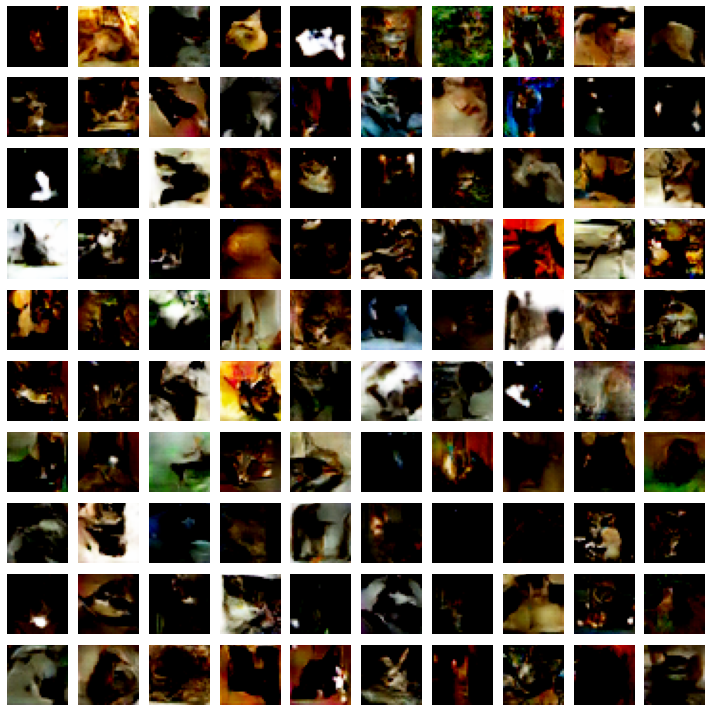

Epoch: 601 	 Discriminator Loss: 0.24245551228523254 		 Generator Loss: 4.184979438781738
Epoch: 602 	 Discriminator Loss: 0.23152592778205872 		 Generator Loss: 5.107700824737549
Epoch: 603 	 Discriminator Loss: 0.25059598684310913 		 Generator Loss: 3.408061981201172
Epoch: 604 	 Discriminator Loss: 0.287018358707428 		 Generator Loss: 4.596930503845215
Epoch: 605 	 Discriminator Loss: 0.2629433274269104 		 Generator Loss: 3.8513545989990234
Epoch: 606 	 Discriminator Loss: 0.2219250202178955 		 Generator Loss: 4.859753131866455
Epoch: 607 	 Discriminator Loss: 0.25908777117729187 		 Generator Loss: 4.475569725036621
Epoch: 608 	 Discriminator Loss: 0.22973640263080597 		 Generator Loss: 4.695374965667725
Epoch: 609 	 Discriminator Loss: 0.27563512325286865 		 Generator Loss: 3.412473678588867
Epoch: 610 	 Discriminator Loss: 0.25164246559143066 		 Generator Loss: 4.474210739135742
Epoch: 611 	 Discriminator Loss: 0.23630288243293762 		 Generator Loss: 4.922138214111328
Epoch: 612 	 

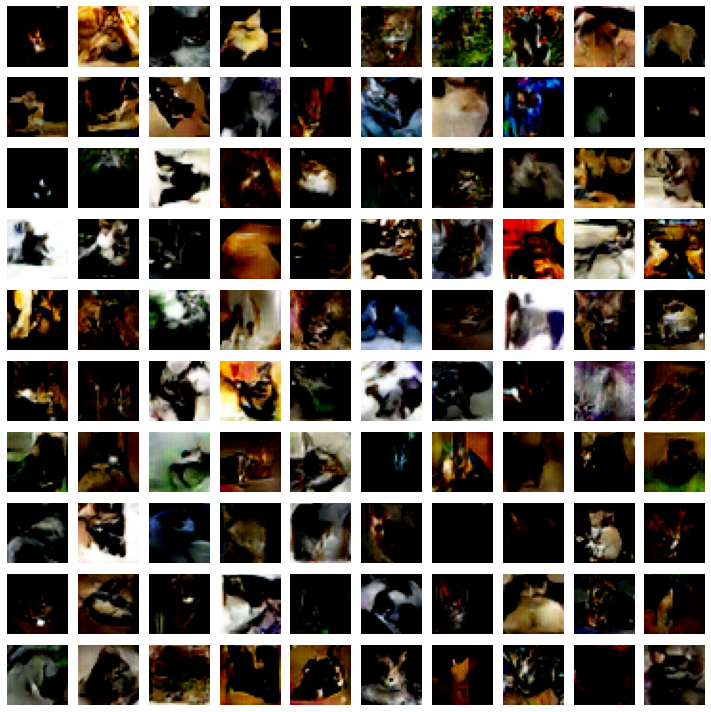

Epoch: 626 	 Discriminator Loss: 0.27045321464538574 		 Generator Loss: 4.258821487426758
Epoch: 627 	 Discriminator Loss: 0.2921767830848694 		 Generator Loss: 4.109882354736328
Epoch: 628 	 Discriminator Loss: 0.2583204507827759 		 Generator Loss: 3.836923122406006
Epoch: 629 	 Discriminator Loss: 0.26492083072662354 		 Generator Loss: 3.7112603187561035
Epoch: 630 	 Discriminator Loss: 0.24092797935009003 		 Generator Loss: 3.4513165950775146
Epoch: 631 	 Discriminator Loss: 0.22920365631580353 		 Generator Loss: 4.570968151092529
Epoch: 632 	 Discriminator Loss: 0.23405474424362183 		 Generator Loss: 4.2076334953308105
Epoch: 633 	 Discriminator Loss: 0.24717456102371216 		 Generator Loss: 4.721036911010742
Epoch: 634 	 Discriminator Loss: 0.24655033648014069 		 Generator Loss: 4.284257888793945
Epoch: 635 	 Discriminator Loss: 0.21629193425178528 		 Generator Loss: 3.842416763305664
Epoch: 636 	 Discriminator Loss: 0.324397474527359 		 Generator Loss: 4.162197113037109
Epoch: 637 

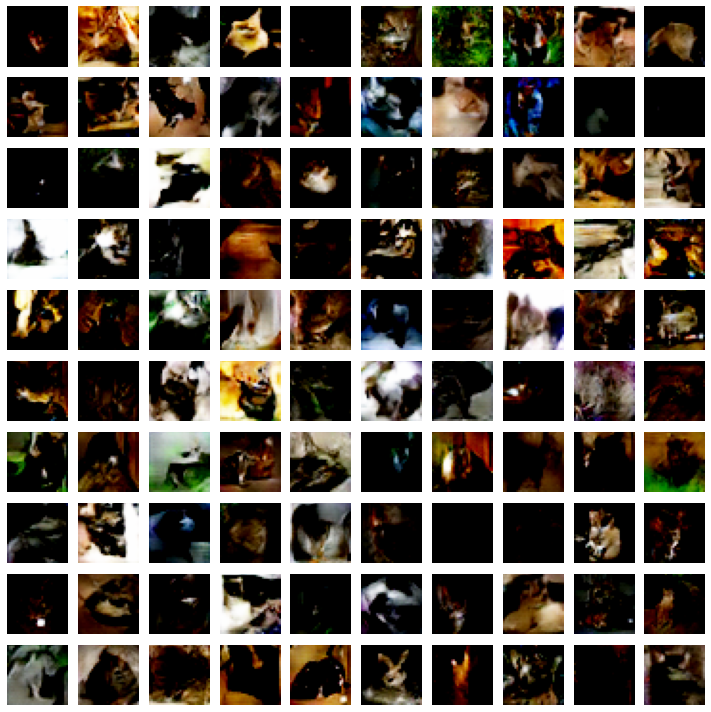

Epoch: 651 	 Discriminator Loss: 0.3573572039604187 		 Generator Loss: 3.7142646312713623
Epoch: 652 	 Discriminator Loss: 0.24077534675598145 		 Generator Loss: 4.001241207122803
Epoch: 653 	 Discriminator Loss: 0.24367791414260864 		 Generator Loss: 4.943661689758301
Epoch: 654 	 Discriminator Loss: 0.29786548018455505 		 Generator Loss: 3.53033447265625
Epoch: 655 	 Discriminator Loss: 0.21093040704727173 		 Generator Loss: 3.957660436630249
Epoch: 656 	 Discriminator Loss: 0.23876819014549255 		 Generator Loss: 3.993156909942627
Epoch: 657 	 Discriminator Loss: 0.2889343202114105 		 Generator Loss: 4.791057109832764
Epoch: 658 	 Discriminator Loss: 0.2706215977668762 		 Generator Loss: 3.542997360229492
Epoch: 659 	 Discriminator Loss: 0.20791152119636536 		 Generator Loss: 3.8929054737091064
Epoch: 660 	 Discriminator Loss: 0.257880836725235 		 Generator Loss: 3.87664532661438
Epoch: 661 	 Discriminator Loss: 0.26684826612472534 		 Generator Loss: 4.7657999992370605
Epoch: 662 	 D

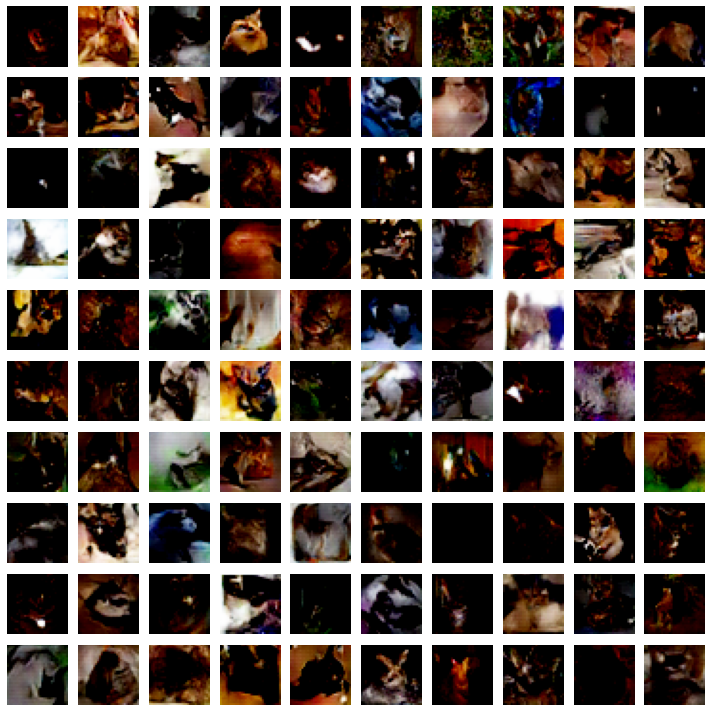

Epoch: 676 	 Discriminator Loss: 0.24525369703769684 		 Generator Loss: 4.020106792449951
Epoch: 677 	 Discriminator Loss: 0.22360873222351074 		 Generator Loss: 3.960944652557373
Epoch: 678 	 Discriminator Loss: 0.2289063036441803 		 Generator Loss: 4.807764053344727
Epoch: 679 	 Discriminator Loss: 0.27726268768310547 		 Generator Loss: 4.038188934326172
Epoch: 680 	 Discriminator Loss: 0.22903968393802643 		 Generator Loss: 4.44938325881958
Epoch: 681 	 Discriminator Loss: 0.22876951098442078 		 Generator Loss: 4.3956193923950195
Epoch: 682 	 Discriminator Loss: 0.2009771466255188 		 Generator Loss: 4.702122688293457
Epoch: 683 	 Discriminator Loss: 0.2759348452091217 		 Generator Loss: 4.100802898406982
Epoch: 684 	 Discriminator Loss: 0.2650683522224426 		 Generator Loss: 3.912937641143799
Epoch: 685 	 Discriminator Loss: 0.20988038182258606 		 Generator Loss: 4.465370178222656
Epoch: 686 	 Discriminator Loss: 0.267009437084198 		 Generator Loss: 4.271788597106934
Epoch: 687 	 Dis

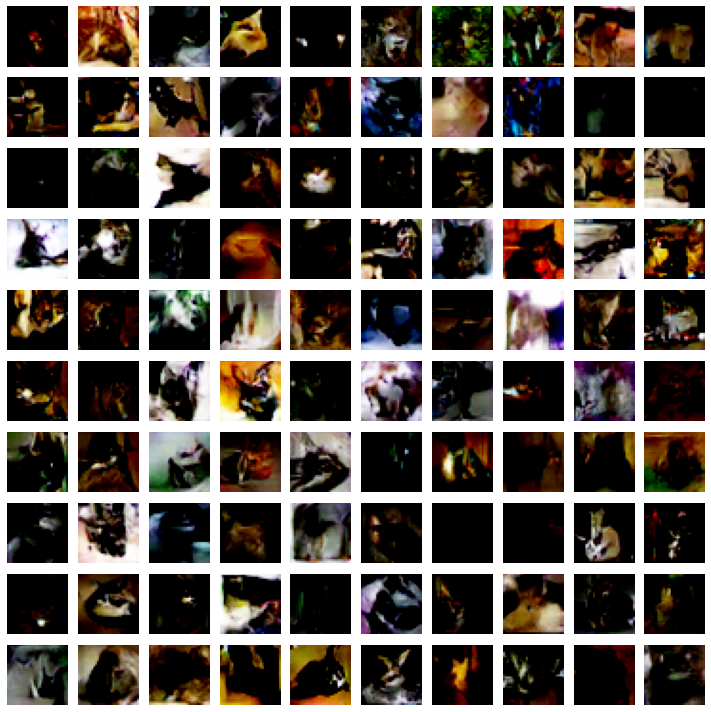

Epoch: 701 	 Discriminator Loss: 0.22323104739189148 		 Generator Loss: 5.505389213562012
Epoch: 702 	 Discriminator Loss: 0.33297374844551086 		 Generator Loss: 4.036210536956787
Epoch: 703 	 Discriminator Loss: 0.24714182317256927 		 Generator Loss: 3.2316906452178955
Epoch: 704 	 Discriminator Loss: 0.3100338578224182 		 Generator Loss: 4.277190208435059
Epoch: 705 	 Discriminator Loss: 0.20941224694252014 		 Generator Loss: 4.257328510284424
Epoch: 706 	 Discriminator Loss: 0.24618901312351227 		 Generator Loss: 4.777914047241211
Epoch: 707 	 Discriminator Loss: 0.21504247188568115 		 Generator Loss: 4.580256938934326
Epoch: 708 	 Discriminator Loss: 0.2306390106678009 		 Generator Loss: 5.024036407470703
Epoch: 709 	 Discriminator Loss: 0.2434212863445282 		 Generator Loss: 3.900543689727783
Epoch: 710 	 Discriminator Loss: 0.21438376605510712 		 Generator Loss: 4.104343414306641
Epoch: 711 	 Discriminator Loss: 0.27465853095054626 		 Generator Loss: 4.902453899383545
Epoch: 712 	

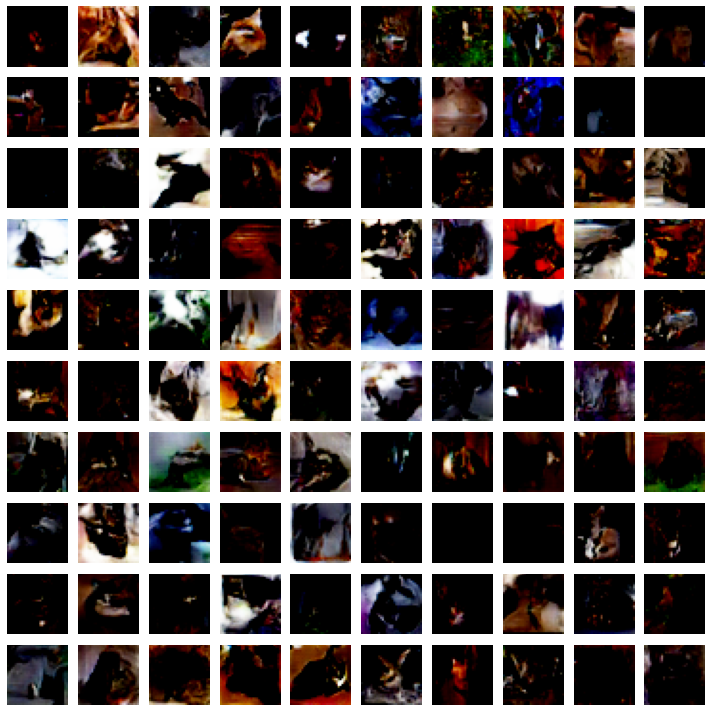

Epoch: 726 	 Discriminator Loss: 0.2119147926568985 		 Generator Loss: 4.2687883377075195
Epoch: 727 	 Discriminator Loss: 0.26249635219573975 		 Generator Loss: 4.425853729248047
Epoch: 728 	 Discriminator Loss: 0.3090864419937134 		 Generator Loss: 4.971294403076172
Epoch: 729 	 Discriminator Loss: 0.23204055428504944 		 Generator Loss: 4.207606315612793
Epoch: 730 	 Discriminator Loss: 0.22857998311519623 		 Generator Loss: 4.505287170410156
Epoch: 731 	 Discriminator Loss: 0.29913970828056335 		 Generator Loss: 3.358971357345581
Epoch: 732 	 Discriminator Loss: 0.21217267215251923 		 Generator Loss: 4.038519859313965
Epoch: 733 	 Discriminator Loss: 0.20522519946098328 		 Generator Loss: 4.219120502471924
Epoch: 734 	 Discriminator Loss: 0.286466121673584 		 Generator Loss: 3.6330554485321045
Epoch: 735 	 Discriminator Loss: 0.261513352394104 		 Generator Loss: 4.637276649475098
Epoch: 736 	 Discriminator Loss: 0.2332664281129837 		 Generator Loss: 4.518133163452148
Epoch: 737 	 Di

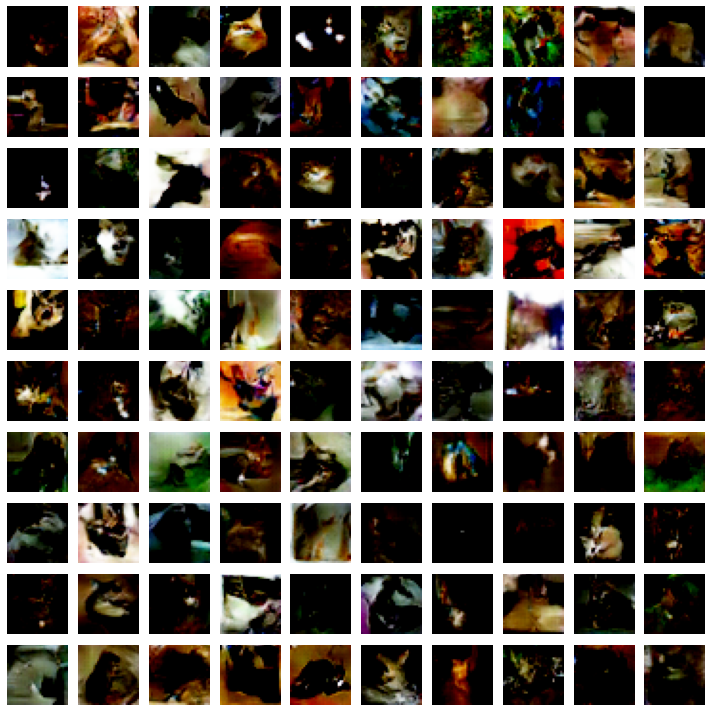

Epoch: 751 	 Discriminator Loss: 0.2476445436477661 		 Generator Loss: 4.040091514587402
Epoch: 752 	 Discriminator Loss: 0.22129401564598083 		 Generator Loss: 4.073683738708496
Epoch: 753 	 Discriminator Loss: 0.20825208723545074 		 Generator Loss: 4.847962379455566
Epoch: 754 	 Discriminator Loss: 0.23210345208644867 		 Generator Loss: 3.557819366455078
Epoch: 755 	 Discriminator Loss: 0.2300804704427719 		 Generator Loss: 4.167226791381836
Epoch: 756 	 Discriminator Loss: 0.2332306057214737 		 Generator Loss: 4.602296829223633
Epoch: 757 	 Discriminator Loss: 0.2392876148223877 		 Generator Loss: 4.230475425720215
Epoch: 758 	 Discriminator Loss: 0.21659210324287415 		 Generator Loss: 3.891982078552246
Epoch: 759 	 Discriminator Loss: 0.23620857298374176 		 Generator Loss: 3.9012372493743896
Epoch: 760 	 Discriminator Loss: 0.2531863749027252 		 Generator Loss: 3.84584379196167
Epoch: 761 	 Discriminator Loss: 0.23542219400405884 		 Generator Loss: 4.9506425857543945
Epoch: 762 	 D

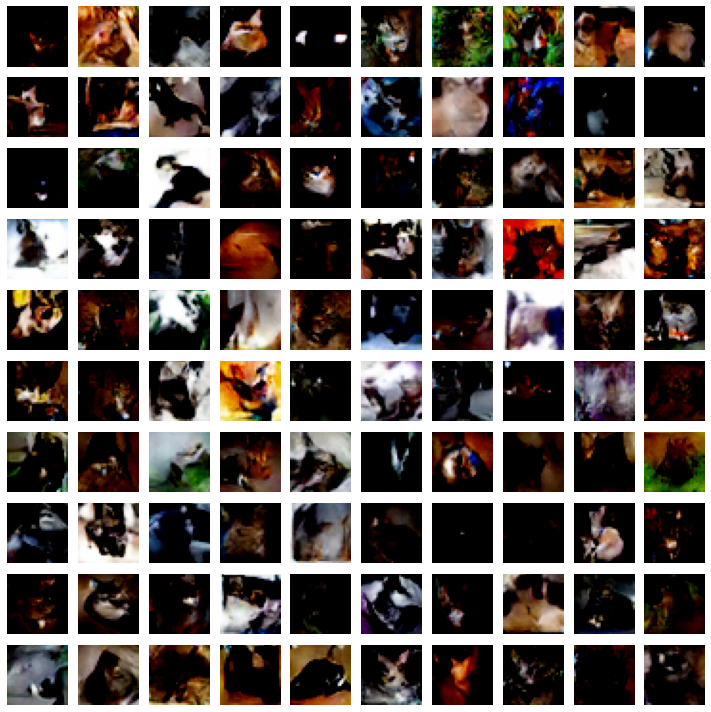

Epoch: 776 	 Discriminator Loss: 0.30909639596939087 		 Generator Loss: 3.081808567047119
Epoch: 777 	 Discriminator Loss: 0.25185689330101013 		 Generator Loss: 4.0790605545043945
Epoch: 778 	 Discriminator Loss: 0.24773207306861877 		 Generator Loss: 4.438121318817139
Epoch: 779 	 Discriminator Loss: 0.22823143005371094 		 Generator Loss: 3.7862496376037598
Epoch: 780 	 Discriminator Loss: 0.28397855162620544 		 Generator Loss: 4.233903408050537
Epoch: 781 	 Discriminator Loss: 0.25977277755737305 		 Generator Loss: 3.777463912963867
Epoch: 782 	 Discriminator Loss: 0.2513437271118164 		 Generator Loss: 3.704078197479248
Epoch: 783 	 Discriminator Loss: 0.22805403172969818 		 Generator Loss: 4.657041549682617
Epoch: 784 	 Discriminator Loss: 0.25223448872566223 		 Generator Loss: 4.539562225341797
Epoch: 785 	 Discriminator Loss: 0.2295042872428894 		 Generator Loss: 4.137500286102295
Epoch: 786 	 Discriminator Loss: 0.23510989546775818 		 Generator Loss: 3.7165908813476562
Epoch: 78

In [19]:
# Constant noise for viewing how the GAN progresses
static_noise = np.random.normal(0, 1, size=(100, noise_dim))

disc_loss = []
gen_loss = []

# Training loop
for epoch in range(epochs):
    for batch in range(steps_per_epoch):
        # generate noise/x train data for gan/generator
        noise = np.random.normal(0, 1, size=(batch_size, noise_dim))
        # fetch real data
        real_x = x_train[np.random.randint(0, x_train.shape[0], size=batch_size)]
        # generate fake data
        fake_x = generator.predict(noise)

        # combine fake and real data to generate x_train values for discriminator
        x = np.concatenate((real_x, fake_x))

        # generate y_train for discriminator by setting 0.9 for real data and 0 for fake data
        disc_y = np.zeros(2*batch_size)
        disc_y[:batch_size] = 0.9

        # train discriminator
        d_loss = discriminator.train_on_batch(x, disc_y)

        # generate y_train for gan/generator
        y_gen = np.ones(batch_size)
        
        # train gan/generator
        g_loss = gan.train_on_batch(noise, y_gen)
        
    disc_loss.append(d_loss)
    gen_loss.append(g_loss)
    
    # display progress after every epoch
    print(f'Epoch: {epoch} \t Discriminator Loss: {d_loss} \t\t Generator Loss: {g_loss}')
    
    if epoch % 25 == 0:
        show_images(static_noise, epoch)

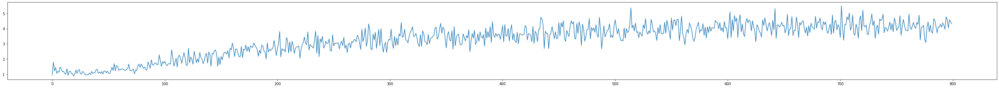

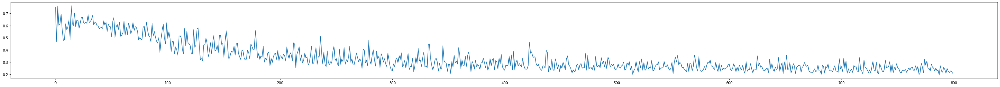

In [20]:
# looking at the loss pattern of generator and discriminator
plt.figure(figsize=(50, 4))
plt.plot(gen_loss);
plt.show()
plt.figure(figsize=(50, 4))
plt.plot(disc_loss);
plt.show()

realdata scores: [[0.82812977]
 [0.9772798 ]
 [0.7023518 ]
 [0.8695237 ]
 [0.8289577 ]
 [0.98451847]
 [0.88301015]
 [0.86995137]
 [0.5954819 ]
 [0.5299924 ]]
average: 0.8069197
fakedata scores: [[0.02032641]
 [0.00524324]
 [0.00676131]
 [0.0903666 ]
 [0.16694239]
 [0.01067215]
 [0.00157422]
 [0.00657979]
 [0.01123049]
 [0.03569008]]
average: 0.035538666


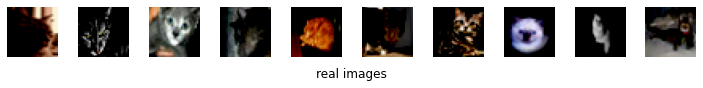

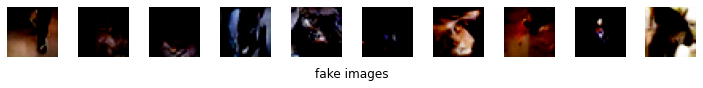

In [22]:
# get random numbers from real dataset and predict
real_data = x_train[np.random.randint(0, x_train.shape[0], 10)]
realdata_scores = discriminator.predict(real_data)
print('realdata scores:', realdata_scores)
print('average:', np.mean(realdata_scores))

noise = np.random.normal(0, 1, size=(10, noise_dim))
fake_data = generator.predict(noise)
fakedata_scores = discriminator.predict(fake_data)
print('fakedata scores:', fakedata_scores)
print('average:', np.mean(fakedata_scores))

plt.figure(figsize=(10, 1))
plt.suptitle('real images', y=0)
for i, image in enumerate(real_data):
    plt.subplot(1, 10, i+1)
    if channels == 1:
        plt.imshow(np.clip(image.reshape((img_rows, img_cols)), 0.0, 1.0), cmap='gray')
    else:
        plt.imshow(np.clip(image.reshape((img_rows, img_cols, channels)), 0.0, 1.0))
    plt.axis('off')

plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 1))
plt.suptitle('fake images', y=0)
for i, image in enumerate(fake_data):
    plt.subplot(1, 10, i+1)
    if channels == 1:
        plt.imshow(np.clip(image.reshape((img_rows, img_cols)), 0.0, 1.0), cmap='gray')
    else:
        plt.imshow(np.clip(image.reshape((img_rows, img_cols, channels)), 0.0, 1.0))
    plt.axis('off')

plt.tight_layout()


In [24]:
# Turn the training process into a GIF
from PIL import Image, ImageDraw

image_names = os.listdir(save_path)
frames = []
for image in sorted(image_names, key=lambda name: int(''.join(i for i in name if i.isdigit()))):
    frames.append(Image.open(save_path + '/' + image))

frames[0].save('gan_training.gif', format='GIF', append_images=frames[1:], save_all=True, duration=80, loop=0)

discriminator.save('dcdiscriminator.hdf5')
generator.save('dcgenerator.hdf5')